In [2]:
import os

import geopandas as gpd
import pandas as pd
import shapely
import matplotlib as mpl
import matplotlib.pyplot as plt
import geopy
import urllib
from shapely.geometry import shape
import contextily as ctx

import plotly.express as px
import plotly.graph_objects as go

In [3]:
crs =     'epsg:3857'
osm_crs=  'epsg:4326'

# Functions

In [4]:
def download_if_nexist(url, filename):
    if not os.path.isfile(filename):
        with urllib.request.urlopen(url) as response:
            with open(filename, "wb") as f:
                f.write(response.read())

In [5]:
def get_osm_polyg(name):
    url = f"http://nominatim.openstreetmap.org/search.php?q={name}&format=json&limit=1&polygon_geojson=1"
    with urllib.request.urlopen(url) as response:
        return shape(json.loads(response.read())[0]["geojson"])


# Load data

In [6]:
def get_here(name):
    apiKey = "Xz4PUNiQ8c4R_mVCtbu9U7rKQKBMe2lPnQySSH5axzE"
    
    host_name = "geocode.search.hereapi.com"
    
    params = urllib.parse.urlencode({"apiKey": apiKey,
                                     "resultType":"locality", 
                                    "q":name,
                                    })
    
    url = f"https://{host_name}/v1/geocode?{params}"
    
    with urllib.request.urlopen(url) as response:
        res = response.read()
        res = json.loads(res)
        return res

## Zip code list

In [40]:
download_if_nexist("https://www.bpost2.be/zipcodes/files/zipcodes_alpha_fr_new.xls",
                  "data/zipcodes_alpha_fr_new.xls")

zipcodes = pd.read_excel("data/zipcodes_alpha_fr_new.xls")
zipcodes = zipcodes.rename({"Code postal":"zipcode", "Commune principale": "main_commune", "Localité":"locality"}, axis=1)
zipcodes["zipcode"] = zipcodes["zipcode"].astype(str)
zipcodes["is_special"] = zipcodes["Sous-commune"].isnull()
zipcodes

,zipcode,locality,Sous-commune,main_commune,Province,is_special
0,2970,'S Gravenwezel,Oui,SCHILDE,ANVERS,False
1,3700,'S Herenelderen,Oui,TONGEREN,LIMBOURG,False
2,7510,3 Suisses,NaN,3 Suisses,NaN,True
3,9420,Aaigem,Oui,ERPE-MERE,FLANDRE-ORIENTALE,False
4,8511,Aalbeke,Oui,KORTRIJK,FLANDRE-OCCIDENTALE,False
...,...,...,...,...,...,...
2760,3690,Zutendaal,Non,ZUTENDAAL,LIMBOURG,False
2761,8550,Zwevegem,Non,ZWEVEGEM,FLANDRE-OCCIDENTALE,False
2762,8750,Zwevezele,Oui,WINGENE,FLANDRE-OCCIDENTALE,False
2763,9052,Zwijnaarde,Oui,GENT,FLANDRE-ORIENTALE,False


## Zip code centers

In [7]:
# https://data.gov.be/fr/dataset/328ba4f140ba0e870dfc9c70635fe7c1840980b1
download_if_nexist("https://www.odwb.be/api/v2/catalog/datasets/code-postaux-belge/exports/geojson",
                  "data/zipcode_centers.geojson")

zipcodes_geo = gpd.read_file("data/zipcode_centers.geojson")
zipcodes_geo = zipcodes_geo.rename({"column_1": "zipcode", "column_2": "locality"}, axis=1)[["locality","zipcode", "geometry"]]

zipcodes_geo = zipcodes_geo.to_crs(crs)
zipcodes_geo

,locality,zipcode,geometry
0,Ixelles,1050,POINT (487754.219 6589918.068)
1,Koekelberg,1081,POINT (481535.656 6596965.764)
2,Haren,1130,POINT (491205.143 6602205.979)
3,Woluwe-Saint-Pierre,1150,POINT (494625.526 6591144.170)
4,Incourt,1315,POINT (534216.002 6566956.791)
...,...,...,...
2752,Ertvelde,9940,POINT (417134.047 6653080.277)
2753,Boekhoute,9961,POINT (412545.747 6665801.135)
2754,Sint-Jan-In-Eremo,9982,POINT (398534.241 6668876.259)
2755,Waterland-Oudeman,9988,POINT (399698.031 6672595.592)


## Zip code boundaries

In [8]:
zipcode_boundaries_filename = "data/zipcode_boundaries_shapefile_3812.zip"

In [9]:
download_if_nexist("https://bgu.bpost.be/assets/9738c7c0-5255-11ea-8895-34e12d0f0423_x-shapefile_3812.zip",
                  zipcode_boundaries_filename)

In [10]:
zipcodes_boundaries = gpd.read_file(f"zip://{zipcode_boundaries_filename}/3812")
zipcodes_boundaries["is_special"] = zipcodes_boundaries.CP_speciau ==1
zipcodes_boundaries = zipcodes_boundaries.rename({"nouveau_PO":"zipcode"}, axis=1)[["zipcode", "is_special", "geometry"]]

zipcodes_boundaries = zipcodes_boundaries.dissolve(["zipcode", "is_special"]).reset_index()

zipcodes_boundaries = zipcodes_boundaries.to_crs(crs)
zipcodes_boundaries

,zipcode,is_special,geometry
0,1000,False,MULTIPOLYGON Z (((487951.058 6600061.994 0.000...
1,1005,True,"POLYGON Z ((484391.808 6593846.983 0.000, 4844..."
2,1006,True,"POLYGON Z ((484413.037 6593943.815 0.000, 4843..."
3,1007,True,"POLYGON Z ((486232.320 6594255.851 0.000, 4862..."
4,1008,True,"POLYGON Z ((486000.332 6594258.665 0.000, 4858..."
...,...,...,...
1182,9982,False,"POLYGON Z ((398126.149 6670079.581 0.000, 3981..."
1183,9988,False,"POLYGON Z ((402165.046 6674165.098 0.000, 4021..."
1184,9990,False,"POLYGON Z ((383123.261 6664423.574 0.000, 3831..."
1185,9991,False,"POLYGON Z ((389466.378 6660430.021 0.000, 3895..."


## NIS code boundaries

In [11]:
download_if_nexist("https://statbel.fgov.be/sites/default/files/files/opendata/Statistische%20sectoren/sh_statbel_geojson.zip",
                  "data/stat_sectors.zip")
statistical_sectors = gpd.read_file("zip://data/stat_sectors.zip")
statistical_sectors["CD_MUNTY_REFNIS"] = statistical_sectors["CD_MUNTY_REFNIS"].astype(str)

In [12]:
nis_boundaries = statistical_sectors[["CD_MUNTY_REFNIS", "TX_MUNTY_DESCR_NL", "TX_MUNTY_DESCR_FR", "geometry"]].dissolve(by="CD_MUNTY_REFNIS").reset_index()
nis_boundaries = nis_boundaries.rename({"CD_MUNTY_REFNIS": "niscode"}, axis=1)
nis_boundaries = nis_boundaries.to_crs(crs)

# Spatial join : polygon <-> point

In [13]:
spatial_join_zip = gpd.sjoin(zipcodes_boundaries, zipcodes_geo)
spatial_join_zip

,zipcode_left,is_special,geometry,index_right,locality,zipcode_right
0,1000,False,MULTIPOLYGON Z (((487951.058 6600061.994 0.000...,1678,Bruxelles,1000
8,1020,False,"POLYGON Z ((484519.836 6603848.988 0.000, 4845...",1139,Laeken,1020
9,1030,False,"POLYGON Z ((488633.964 6600056.547 0.000, 4887...",1140,Schaerbeek,1030
13,1040,False,MULTIPOLYGON Z (((486480.015 6594068.947 0.000...,2214,Etterbeek,1040
21,1050,False,MULTIPOLYGON Z (((486898.793 6593112.249 0.000...,0,Ixelles,1050
...,...,...,...,...,...,...
1183,9988,False,"POLYGON Z ((402165.046 6674165.098 0.000, 4021...",547,Watervliet,9988
1183,9988,False,"POLYGON Z ((402165.046 6674165.098 0.000, 4021...",2755,Waterland-Oudeman,9988
1184,9990,False,"POLYGON Z ((383123.261 6664423.574 0.000, 3831...",2756,Maldegem,9990
1185,9991,False,"POLYGON Z ((389466.378 6660430.021 0.000, 3895...",2212,Adegem,9991


In [20]:
spatial_join_mismatches = spatial_join_zip[spatial_join_zip.zipcode_left != spatial_join_zip.zipcode_right].reset_index(drop=True)
spatial_join_mismatches

,zipcode_left,is_special,geometry,index_right,locality,zipcode_right
0,1130,False,"POLYGON Z ((492165.130 6604187.117 0.000, 4921...",1264,Haren,3700
1,1541,False,"POLYGON Z ((442698.747 6572867.831 0.000, 4427...",1047,Driekapellen,8600
2,2000,False,"POLYGON Z ((491447.469 6663216.307 0.000, 4914...",1198,Antwerpen,2040
3,2000,False,"POLYGON Z ((491447.469 6663216.307 0.000, 4914...",2256,Antwerpen,2030
4,2000,False,"POLYGON Z ((491447.469 6663216.307 0.000, 4914...",2255,Antwerpen,2018
5,2000,False,"POLYGON Z ((491447.469 6663216.307 0.000, 4914...",593,Antwerpen,2050
6,2000,False,"POLYGON Z ((491447.469 6663216.307 0.000, 4914...",1736,Antwerpen,2020
7,2000,False,"POLYGON Z ((491447.469 6663216.307 0.000, 4914...",2259,Antwerpen,2060
8,2180,False,"POLYGON Z ((496588.712 6668893.730 0.000, 4964...",1245,Laar,3400
9,2180,False,"POLYGON Z ((496588.712 6668893.730 0.000, 4964...",2262,Schriek,2223


In [17]:
spatial_join_mismatches.shape

(52, 6)

In [44]:
i=51
print("Mismatch record:")
display(spatial_join_mismatches.iloc[[i]])

zip1 = spatial_join_mismatches.iloc[i].zipcode_left
zip2 = spatial_join_mismatches.iloc[i].zipcode_right

print("From bPost:")
display( zipcodes[ zipcodes.zipcode.isin([zip1, zip2])])
print("Know by OSM at the given point:")
pt = zipcodes_geo.to_crs(osm_crs).loc[spatial_join_mismatches.iloc[i].index_right].geometry
geolocator = geopy.geocoders.Nominatim(user_agent="smalsresearch")
print(geolocator.reverse(f"{pt.y}, {pt.x}").address)

print("Know by OSM for the given locality:")
loc = zipcodes_geo.loc[spatial_join_mismatches.iloc[i].index_right].locality
print(geolocator.geocode(f"{loc}, Belgium").address)


query = f"zipcode in ('{zip1}', '{zip2}')"


df_bnd = zipcodes_boundaries.assign(label=zipcodes_boundaries.zipcode).query(query).to_crs(osm_crs)
df_pnt = zipcodes_geo.assign(label=zipcodes_geo.zipcode+" "+zipcodes_geo.locality).query(query).to_crs(osm_crs)

df_pnt["mismatch"] = False
df_pnt.loc[spatial_join_mismatches.iloc[i].index_right, "mismatch"] = True


fig = px.choropleth_mapbox(df_bnd, 
                           geojson=df_bnd.geometry, 
                           locations=df_bnd.index, 
                           hover_name="label",
                           color=df_bnd['label'],
                           center={"lat": df_bnd.bounds.mean()[["miny", "maxy"]].mean(), 
                                   "lon": df_bnd.bounds.mean()[["minx", "maxx"]].mean()},
                           mapbox_style="open-street-map",
                           #zoom=10,
                           opacity=0.5,
                           
                   )

for i, bloc in df_pnt.groupby("mismatch"): 
    fig.add_trace(go.Scattermapbox(lat=bloc.geometry.y,
                                   lon=bloc.geometry.x,
                                   mode='markers+text', # "markers+text",
                                   text=bloc.label, 
                                   name="Zipcode centers" + (" (mismatch)" if i else ""),
                                   textposition="bottom center"
                                  )
                            )
fig.show()

Mismatch record:


,zipcode_left,is_special,geometry,index_right,locality,zipcode_right
51,9790,False,"POLYGON Z ((395001.891 6600120.574 0.000, 3950...",529,Ooike,9700


From bPost:


,zipcode,locality,Sous-commune,main_commune,Province,is_special
239,9700,Bevere,Oui,OUDENAARDE,FLANDRE-ORIENTALE,False
590,9700,Edelare,Oui,OUDENAARDE,FLANDRE-ORIENTALE,False
600,9700,Eine,Oui,OUDENAARDE,FLANDRE-ORIENTALE,False
617,9790,Elsegem,Oui,WORTEGEM-PETEGEM,FLANDRE-ORIENTALE,False
627,9700,Ename,Oui,OUDENAARDE,FLANDRE-ORIENTALE,False
1036,9700,Heurne,Oui,OUDENAARDE,FLANDRE-ORIENTALE,False
1345,9700,Leupegem,Oui,OUDENAARDE,FLANDRE-ORIENTALE,False
1493,9700,Mater,Oui,OUDENAARDE,FLANDRE-ORIENTALE,False
1521,9700,Melden,Oui,OUDENAARDE,FLANDRE-ORIENTALE,False
1630,9790,Moregem,Oui,WORTEGEM-PETEGEM,FLANDRE-ORIENTALE,False


Know by OSM at the given point:
Trage weg 37, Oudenaarde, Oost-Vlaanderen, Vlaanderen, 9790, België / Belgique / Belgien
Know by OSM for the given locality:
Ooike, Oudenaarde, Oost-Vlaanderen, Vlaanderen, België / Belgique / Belgien


# Spatial join: polygon <-> polygon

In [25]:
zip_nis_join = gpd.sjoin(zipcodes_boundaries[["zipcode", "geometry"]], 
          nis_boundaries[["niscode",  "TX_MUNTY_DESCR_FR", "TX_MUNTY_DESCR_NL", "geometry"]])

zip_nis_join = zip_nis_join.merge(nis_boundaries[["geometry"]].rename({"geometry": "geometry_nis"}, axis=1), left_on="index_right", right_index=True )
zip_nis_join

,zipcode,geometry,index_right,niscode,TX_MUNTY_DESCR_FR,TX_MUNTY_DESCR_NL,geometry_nis
0,1000,MULTIPOLYGON Z (((487951.058 6600061.994 0.000...,85,21016,Uccle,Ukkel,"POLYGON ((485849.208 6581239.903, 485581.574 6..."
21,1050,MULTIPOLYGON Z (((486898.793 6593112.249 0.000...,85,21016,Uccle,Ukkel,"POLYGON ((485849.208 6581239.903, 485581.574 6..."
37,1170,"POLYGON Z ((490505.055 6588611.777 0.000, 4905...",85,21016,Uccle,Ukkel,"POLYGON ((485849.208 6581239.903, 485581.574 6..."
38,1180,"POLYGON Z ((486166.998 6588921.982 0.000, 4861...",85,21016,Uccle,Ukkel,"POLYGON ((485849.208 6581239.903, 485581.574 6..."
39,1190,"POLYGON Z ((482306.370 6591046.521 0.000, 4823...",85,21016,Uccle,Ukkel,"POLYGON ((485849.208 6581239.903, 485581.574 6..."
...,...,...,...,...,...,...,...
1181,9981,"POLYGON Z ((395583.138 6672678.758 0.000, 3955...",269,43014,Sint-Laureins,Sint-Laureins,"POLYGON ((391860.152 6660049.116, 391523.832 6..."
1182,9982,"POLYGON Z ((398126.149 6670079.581 0.000, 3981...",269,43014,Sint-Laureins,Sint-Laureins,"POLYGON ((391860.152 6660049.116, 391523.832 6..."
1183,9988,"POLYGON Z ((402165.046 6674165.098 0.000, 4021...",269,43014,Sint-Laureins,Sint-Laureins,"POLYGON ((391860.152 6660049.116, 391523.832 6..."
1184,9990,"POLYGON Z ((383123.261 6664423.574 0.000, 3831...",269,43014,Sint-Laureins,Sint-Laureins,"POLYGON ((391860.152 6660049.116, 391523.832 6..."


In [26]:
def get_intersection_area(rec):
    try : 
        return rec.geometry.intersection(rec.geometry_nis).area
    except shapely.errors.TopologicalError :
        return rec.geometry.intersection(rec.geometry_nis.buffer(0.01)).area
        #return None
zip_nis_join["intersect_area"] = zip_nis_join.apply(get_intersection_area, axis=1)

TopologyException: Input geom 1 is invalid: Self-intersection at or near point 621475.17765932367 6496646.4277227381 at 621475.17765932367 6496646.4277227381
TopologyException: Input geom 1 is invalid: Self-intersection at or near point 621475.17765932367 6496646.4277227381 at 621475.17765932367 6496646.4277227381


In [27]:
zip_nis_join["intersect_area_ratio"] = zip_nis_join["intersect_area"]/zip_nis_join.area

<AxesSubplot:>

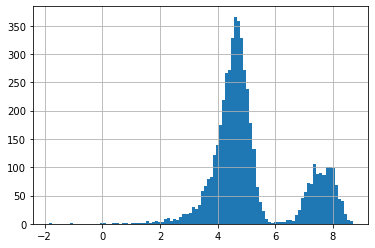

In [28]:
np.log10(zip_nis_join.intersect_area).hist(bins=100)

<AxesSubplot:>

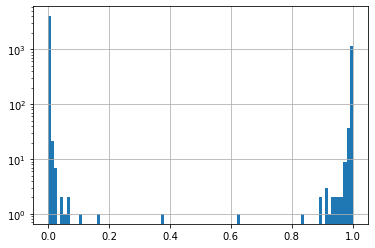

In [31]:
zip_nis_join.intersect_area_ratio.hist(bins=100, log=True)

  0%|          | 0/19 [00:00<?, ?it/s]

,zip_to_one_nis,nis_to_at_least_one_zip
thresh,,
5,0.994945,1.000000
10,0.997473,1.000000
15,0.998315,1.000000
20,0.999158,1.000000
25,0.999158,1.000000
30,0.999158,1.000000
35,0.999158,1.000000
40,1.000000,1.000000
45,1.000000,1.000000


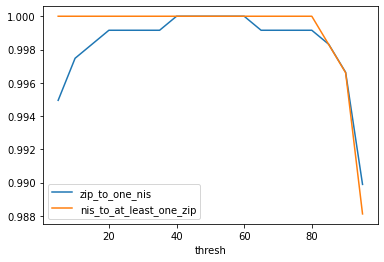

In [34]:
area_thresholds=[]
from tqdm.auto import tqdm
for th in tqdm(range(5, 100, 5)):

    query = f"intersect_area_ratio>{th/100.0}"
    
    zip_to_one_nis = zip_nis_join.query(query).groupby("zipcode").niscode.count().value_counts().loc[1]/zip_nis_join.zipcode.nunique()
    nis_to_at_least_one_zip = zip_nis_join.query(query).niscode.nunique()/zip_nis_join.niscode.nunique()
    
    area_thresholds.append({"thresh":th, 
              "zip_to_one_nis": zip_to_one_nis, 
              "nis_to_at_least_one_zip": nis_to_at_least_one_zip})
    
area_thresholds = pd.DataFrame(area_thresholds).set_index("thresh")  
area_thresholds.plot()
area_thresholds

## Detect ambiguities

In [48]:
sel = zip_nis_join[zip_nis_join.intersect_area_ratio.between(0.05, 0.95)].reset_index(drop=True)
sel

,zipcode,geometry,index_right,niscode,TX_MUNTY_DESCR_FR,TX_MUNTY_DESCR_NL,geometry_nis,intersect_area,intersect_area_ratio
0,1050,MULTIPOLYGON Z (((486898.793 6593112.249 0.000...,78,21009,Ixelles,Elsene,"MULTIPOLYGON (((489508.609 6587455.001, 489513...",1.580816e+07,0.890251
1,1040,MULTIPOLYGON Z (((486480.015 6594068.947 0.000...,74,21005,Etterbeek,Etterbeek,"POLYGON ((488721.188 6590011.041, 488631.265 6...",7.924474e+06,0.836624
2,1040,MULTIPOLYGON Z (((486480.015 6594068.947 0.000...,73,21004,Bruxelles,Brussel,"POLYGON ((489515.641 6586199.724, 489565.307 6...",1.522967e+06,0.160787
3,1050,MULTIPOLYGON Z (((486898.793 6593112.249 0.000...,73,21004,Bruxelles,Brussel,"POLYGON ((489515.641 6586199.724, 489565.307 6...",1.862636e+06,0.104896
4,1804,"POLYGON Z ((494129.071 6612452.942 0.000, 4942...",112,23088,Vilvorde,Vilvoorde,"POLYGON ((488449.379 6605303.928, 488442.394 6...",2.548391e+06,0.624786
5,1931,"POLYGON Z ((496389.189 6606019.363 0.000, 4964...",103,23047,Machelen (Hal-Vilvorde),Machelen (Halle-Vilvoorde),"POLYGON ((496124.319 6601626.434, 496044.634 6...",4.973487e+06,0.932875
6,1348,MULTIPOLYGON Z (((513291.512 6561137.196 0.000...,177,25121,Ottignies-Louvain-la-Neuve,Ottignies-Louvain-la-Neuve,"POLYGON ((506570.181 6559828.158, 506529.288 6...",1.644212e+07,0.934252
7,1348,MULTIPOLYGON Z (((513291.512 6561137.196 0.000...,165,25068,Mont-Saint-Guibert,Mont-Saint-Guibert,"POLYGON ((515749.290 6556323.569, 515767.103 6...",1.105338e+06,0.062806
8,1931,"POLYGON Z ((496389.189 6606019.363 0.000, 4964...",110,23081,Steenokkerzeel,Steenokkerzeel,"POLYGON ((504292.962 6604125.964, 504284.084 6...",3.562211e+05,0.066816
9,1804,"POLYGON Z ((494129.071 6612452.942 0.000, 4942...",114,23096,Zemst,Zemst,"POLYGON ((502419.147 6617704.784, 502438.734 6...",1.519584e+06,0.372554


In [57]:
for z in sel.zipcode.unique():
    sel2 = sel[sel.zipcode==z]
    display(sel2)
    display(zipcodes[zipcodes.zipcode==z])
    #     ax = nis_boundaries[nis_boundaries.niscode.isin(sel2.niscode)].plot("niscode", edgecolor='C0', color=None, legend=True, hatch="//")
    #     zipcodes_boundaries[zipcodes_boundaries.zipcode.isin(sel2.zipcode)].plot("zipcode", ax=ax, edgecolor='C1', color=None, legend=True, hatch="o")

    polygons= pd.concat([
        nis_boundaries[nis_boundaries.niscode.isin(sel2.niscode)].rename({"niscode": "label"}, axis=1)[["label", "geometry"]].assign(kind="nis"),
        zipcodes_boundaries[zipcodes_boundaries.zipcode.isin(sel2.zipcode)].rename({"zipcode": "label"}, axis=1)[["label", "geometry"]].assign(kind="zip")])
    polygons=polygons.to_crs(osm_crs)

    fig = px.choropleth_mapbox(polygons, 
                           geojson=polygons.geometry, 
                           locations=polygons.index, 
                           hover_name="label",
                           color=polygons['label'],
                           center={"lat": polygons.bounds.mean()[["miny", "maxy"]].mean(), 
                                   "lon": polygons.bounds.mean()[["minx", "maxx"]].mean()},
                           mapbox_style="open-street-map",
                           #zoom=10,
                           opacity=0.5,
     )

    fig.show()

,zipcode,geometry,index_right,niscode,TX_MUNTY_DESCR_FR,TX_MUNTY_DESCR_NL,geometry_nis,intersect_area,intersect_area_ratio
0,1050,MULTIPOLYGON Z (((486898.793 6593112.249 0.000...,78,21009,Ixelles,Elsene,"MULTIPOLYGON (((489508.609 6587455.001, 489513...",1.580816e+07,0.890251
3,1050,MULTIPOLYGON Z (((486898.793 6593112.249 0.000...,73,21004,Bruxelles,Brussel,"POLYGON ((489515.641 6586199.724, 489565.307 6...",1.862636e+06,0.104896


,zipcode,locality,Sous-commune,main_commune,Province,is_special
1137,1050,Ixelles,Non,IXELLES,BRUXELLES,False


,zipcode,geometry,index_right,niscode,TX_MUNTY_DESCR_FR,TX_MUNTY_DESCR_NL,geometry_nis,intersect_area,intersect_area_ratio
1,1040,MULTIPOLYGON Z (((486480.015 6594068.947 0.000...,74,21005,Etterbeek,Etterbeek,"POLYGON ((488721.188 6590011.041, 488631.265 6...",7.924474e+06,0.836624
2,1040,MULTIPOLYGON Z (((486480.015 6594068.947 0.000...,73,21004,Bruxelles,Brussel,"POLYGON ((489515.641 6586199.724, 489565.307 6...",1.522967e+06,0.160787


,zipcode,locality,Sous-commune,main_commune,Province,is_special
670,1040,Etterbeek,Non,ETTERBEEK,BRUXELLES,False


,zipcode,geometry,index_right,niscode,TX_MUNTY_DESCR_FR,TX_MUNTY_DESCR_NL,geometry_nis,intersect_area,intersect_area_ratio
4,1804,"POLYGON Z ((494129.071 6612452.942 0.000, 4942...",112,23088,Vilvorde,Vilvoorde,"POLYGON ((488449.379 6605303.928, 488442.394 6...",2.548391e+06,0.624786
9,1804,"POLYGON Z ((494129.071 6612452.942 0.000, 4942...",114,23096,Zemst,Zemst,"POLYGON ((502419.147 6617704.784, 502438.734 6...",1.519584e+06,0.372554


,zipcode,locality,Sous-commune,main_commune,Province,is_special
411,1804,Cargovil,NaN,Cargovil,NaN,True


,zipcode,geometry,index_right,niscode,TX_MUNTY_DESCR_FR,TX_MUNTY_DESCR_NL,geometry_nis,intersect_area,intersect_area_ratio
5,1931,"POLYGON Z ((496389.189 6606019.363 0.000, 4964...",103,23047,Machelen (Hal-Vilvorde),Machelen (Halle-Vilvoorde),"POLYGON ((496124.319 6601626.434, 496044.634 6...",4.973487e+06,0.932875
8,1931,"POLYGON Z ((496389.189 6606019.363 0.000, 4964...",110,23081,Steenokkerzeel,Steenokkerzeel,"POLYGON ((504292.962 6604125.964, 504284.084 6...",3.562211e+05,0.066816


,zipcode,locality,Sous-commune,main_commune,Province,is_special
377,1931,Brucargo,NaN,Brucargo,NaN,True


,zipcode,geometry,index_right,niscode,TX_MUNTY_DESCR_FR,TX_MUNTY_DESCR_NL,geometry_nis,intersect_area,intersect_area_ratio
6,1348,MULTIPOLYGON Z (((513291.512 6561137.196 0.000...,177,25121,Ottignies-Louvain-la-Neuve,Ottignies-Louvain-la-Neuve,"POLYGON ((506570.181 6559828.158, 506529.288 6...",1.644212e+07,0.934252
7,1348,MULTIPOLYGON Z (((513291.512 6561137.196 0.000...,165,25068,Mont-Saint-Guibert,Mont-Saint-Guibert,"POLYGON ((515749.290 6556323.569, 515767.103 6...",1.105338e+06,0.062806


,zipcode,locality,Sous-commune,main_commune,Province,is_special
1421,1348,Louvain-La-Neuve,Oui,OTTIGNIES-LOUVAIN-LA-NEUVE,BRABANT WALLON,False


,zipcode,geometry,index_right,niscode,TX_MUNTY_DESCR_FR,TX_MUNTY_DESCR_NL,geometry_nis,intersect_area,intersect_area_ratio
10,6791,"POLYGON Z ((651233.736 6375052.981 0.000, 6512...",511,81015,Messancy,Messancy,"POLYGON ((649341.106 6372547.881, 649323.746 6...",1.179643e+06,0.050624
11,6791,"POLYGON Z ((651233.736 6375052.981 0.000, 6512...",509,81004,Aubange,Aubange,"POLYGON ((640768.763 6369776.286, 640854.827 6...",2.202332e+07,0.945124


,zipcode,locality,Sous-commune,main_commune,Province,is_special
100,6791,Athus,Oui,AUBANGE,LUXEMBOURG,False


,zipcode,geometry,index_right,niscode,TX_MUNTY_DESCR_FR,TX_MUNTY_DESCR_NL,geometry_nis,intersect_area,intersect_area_ratio
12,8370,"POLYGON Z ((352779.442 6672873.019 0.000, 3527...",182,31004,Blankenberge,Blankenberge,"POLYGON ((351291.005 6678361.658, 351378.170 6...",4.518568e+07,0.929984


,zipcode,locality,Sous-commune,main_commune,Province,is_special
274,8370,Blankenberge,Non,BLANKENBERGE,FLANDRE-OCCIDENTALE,False
2419,8370,Uitkerke,Oui,BLANKENBERGE,FLANDRE-OCCIDENTALE,False


,zipcode,geometry,index_right,niscode,TX_MUNTY_DESCR_FR,TX_MUNTY_DESCR_NL,geometry_nis,intersect_area,intersect_area_ratio
13,8400,"POLYGON Z ((333803.784 6659315.542 0.000, 3338...",220,35013,Ostende,Oostende,"POLYGON ((333473.075 6658065.695, 333214.522 6...",9.583254e+07,0.919708


,zipcode,locality,Sous-commune,main_commune,Province,is_special
1796,8400,Oostende,Non,OOSTENDE,FLANDRE-OCCIDENTALE,False
2305,8400,Stene,Oui,OOSTENDE,FLANDRE-OCCIDENTALE,False
2722,8400,Zandvoorde,Oui,OOSTENDE,FLANDRE-OCCIDENTALE,False


,zipcode,geometry,index_right,niscode,TX_MUNTY_DESCR_FR,TX_MUNTY_DESCR_NL,geometry_nis,intersect_area,intersect_area_ratio
14,8450,"POLYGON Z ((335209.560 6660442.416 0.000, 3352...",216,35002,Bredene,Bredene,"POLYGON ((332785.187 6660854.872, 332781.544 6...",3.308973e+07,0.911439


,zipcode,locality,Sous-commune,main_commune,Province,is_special
370,8450,Bredene,Non,BREDENE,FLANDRE-OCCIDENTALE,False


,zipcode,geometry,index_right,niscode,TX_MUNTY_DESCR_FR,TX_MUNTY_DESCR_NL,geometry_nis,intersect_area,intersect_area_ratio
15,8620,"POLYGON Z ((314007.990 6639410.105 0.000, 3139...",243,38016,Nieuport,Nieuwpoort,"POLYGON ((311748.920 6644227.260, 311741.686 6...",7.937914e+07,0.941088


,zipcode,locality,Sous-commune,main_commune,Province,is_special
1717,8620,Nieuwpoort,Non,NIEUWPOORT,FLANDRE-OCCIDENTALE,False
1977,8620,Ramskapelle,Oui,NIEUWPOORT,FLANDRE-OCCIDENTALE,False
2207,8620,Sint-Joris,Oui,NIEUWPOORT,FLANDRE-OCCIDENTALE,False


,zipcode,geometry,index_right,niscode,TX_MUNTY_DESCR_FR,TX_MUNTY_DESCR_NL,geometry_nis,intersect_area,intersect_area_ratio
16,8670,"POLYGON Z ((306290.338 6638386.832 0.000, 3062...",242,38014,Koksijde,Koksijde,"POLYGON ((293891.245 6636439.598, 293807.047 6...",1.140424e+08,0.893834


,zipcode,locality,Sous-commune,main_commune,Province,is_special
1226,8670,Koksijde,Non,KOKSIJDE,FLANDRE-OCCIDENTALE,False
1794,8670,Oostduinkerke,Oui,KOKSIJDE,FLANDRE-OCCIDENTALE,False
2706,8670,Wulpen,Oui,KOKSIJDE,FLANDRE-OCCIDENTALE,False


,zipcode,geometry,index_right,niscode,TX_MUNTY_DESCR_FR,TX_MUNTY_DESCR_NL,geometry_nis,intersect_area,intersect_area_ratio
17,8660,"POLYGON Z ((292212.817 6636289.650 0.000, 2922...",241,38008,La Panne,De Panne,"POLYGON ((291580.460 6633583.610, 291575.448 6...",6.137982e+07,0.910998


,zipcode,locality,Sous-commune,main_commune,Province,is_special
21,8660,Adinkerke,Oui,DE PANNE,FLANDRE-OCCIDENTALE,False
521,8660,De Panne,Non,DE PANNE,FLANDRE-OCCIDENTALE,False
